#**Assignment 2**
**Download any RGB image from google or any other legal site and perform the following tasks in stepwise manner:
Using OpenCV read and display the image in RGB format**

Implement the following functions Without Using OpenCV (from scratch):


    1) Blur the image using convolution operation by employing gaussain filter
       Design the filter of kernel size 3, 5, 7 and sigma value of 1, 10, 50 and check all the combination for blurring the image

    2) Implement the sobel filter to detect edges in horizontal and vertical direction separately    
       Implement Laplacian function to find the edges
         
       
####**Link to the Image Used in the code : [Nature And Landscapes](https://www.istockphoto.com/essential/photo/mountain-landscape-gm517188688-89380423)**

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import math
%matplotlib inline

In [2]:
def load_img():
    img = cv2.imread('example_img.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img,(512,512))
    return img

In [3]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

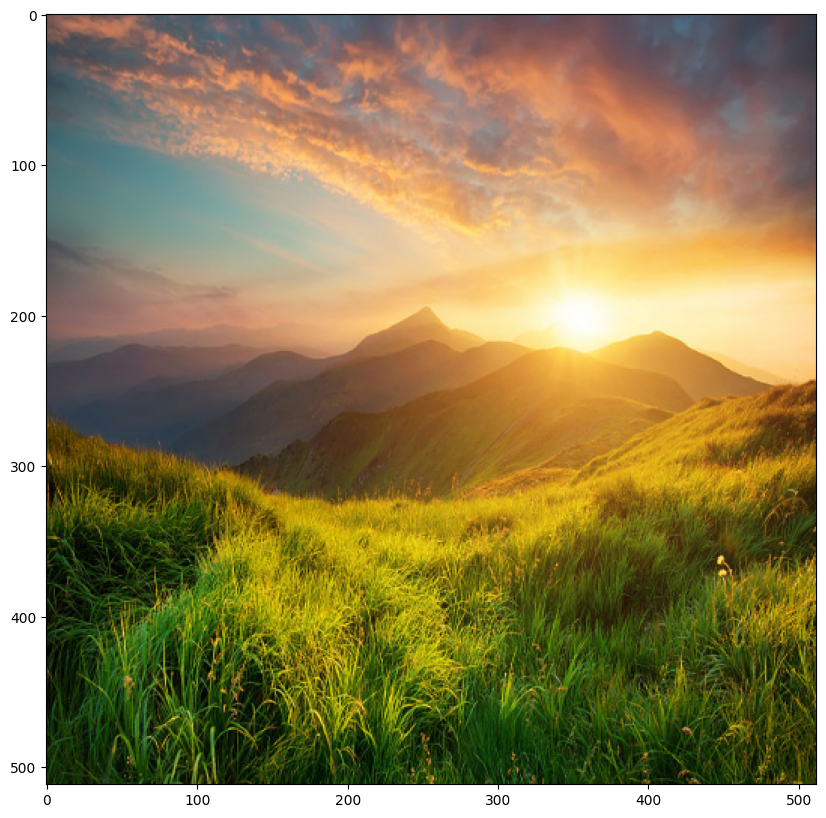

In [4]:
img = load_img()
display_img(img)

#**1. Blurring using Guassian Filter**

First we will write a function that gives Guassian Kernel of specified size and sigma value.

-->This is the formula used to calculate the guassian filter elements.

--> Here x and y are the distance of the element from the center pixel and sigma is the standard deviation of the normal distribution

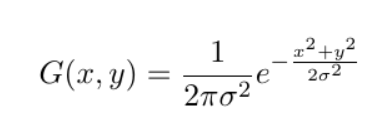



--> Center can simply be calculated by dividing the size by 2.

--> To normalize the gaussian filter we also calculate the total sum of all the elemnents of the gaussian filter.

In [5]:
def gaussian_kernel(size, sigma):
    kernel = [[0] * size for _ in range(size)]
    center = size // 2

    sum_kernel = 0

    for x in range(size):
        for y in range(size):
            exponent = -((x - center) ** 2 + (y - center) ** 2) / (2 * sigma ** 2)
            kernel[x][y] = math.exp(exponent) / (2 * math.pi * sigma ** 2)
            sum_kernel += kernel[x][y]

    for x in range(size):
        for y in range(size):
            kernel[x][y] /= sum_kernel

    kernel = np.array(kernel)

    return kernel

--> Now will do the convolution opertation on the imag with the kernel of different sizes. Below is the code that perform convolution with the given image and the kernel

In [6]:
def conv(img, kernel):
  height, width, colour = img.shape
  k_height, k_width = kernel.shape
  output_img = np.zeros((height, width, colour))
  center_x, center_y = k_height // 2, k_width // 2

  for i in range(height):
    for j in range(width):
      conv_val = 0
      for ii in range(k_height):
        for jj in range(k_width):
          x = i + ii - center_x
          y = j + jj - center_y

          if x >= 0 and x < height and y >= 0 and y < width:
            conv_val += img[x, y] * kernel[ii, jj]

      output_img[i, j] = conv_val

  return output_img

###**Kernel Size = 3 and Sigma = 1**

In [7]:
size = 3
sigma = 1
kernel = gaussian_kernel(size, sigma)

In [8]:
img_blur = conv(img, kernel)

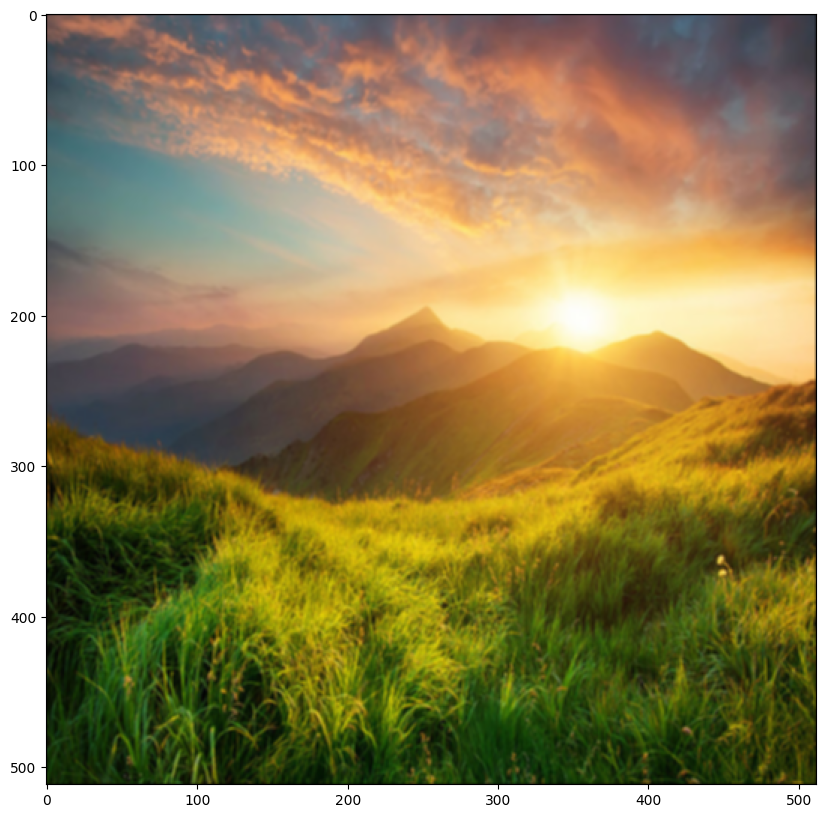

In [9]:
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

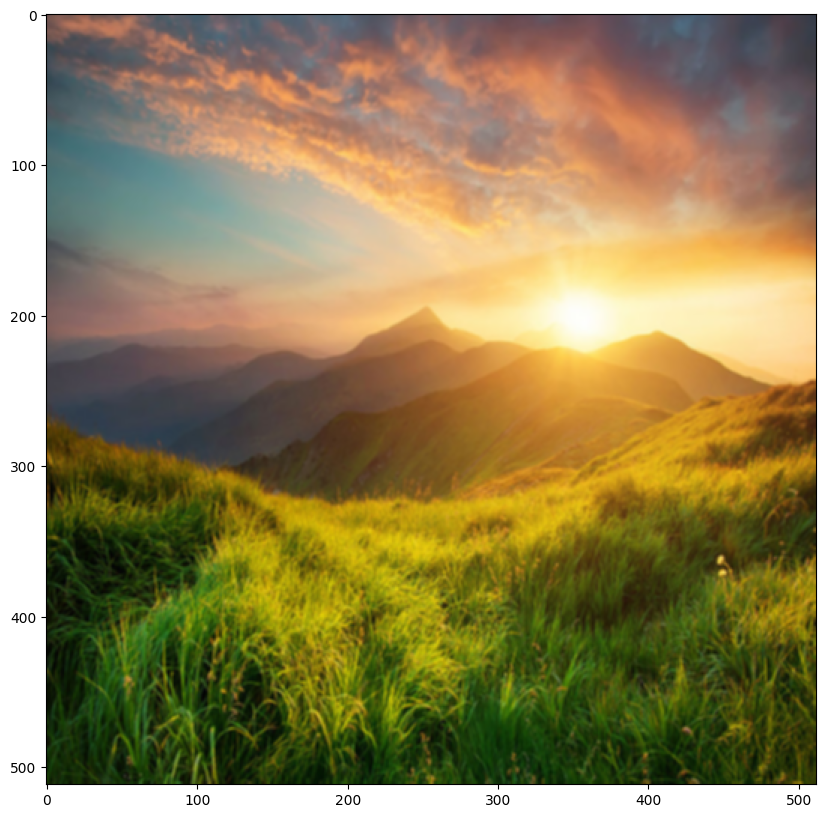

In [10]:
img_blur_ocv = cv2.GaussianBlur(img,(3,3),1)
display_img(img_blur_ocv)

###**Kernel Size = 3 and Sigma = 10**

In [11]:
kernel = gaussian_kernel(3, 10)

In [12]:
img_blur = conv(img, kernel)

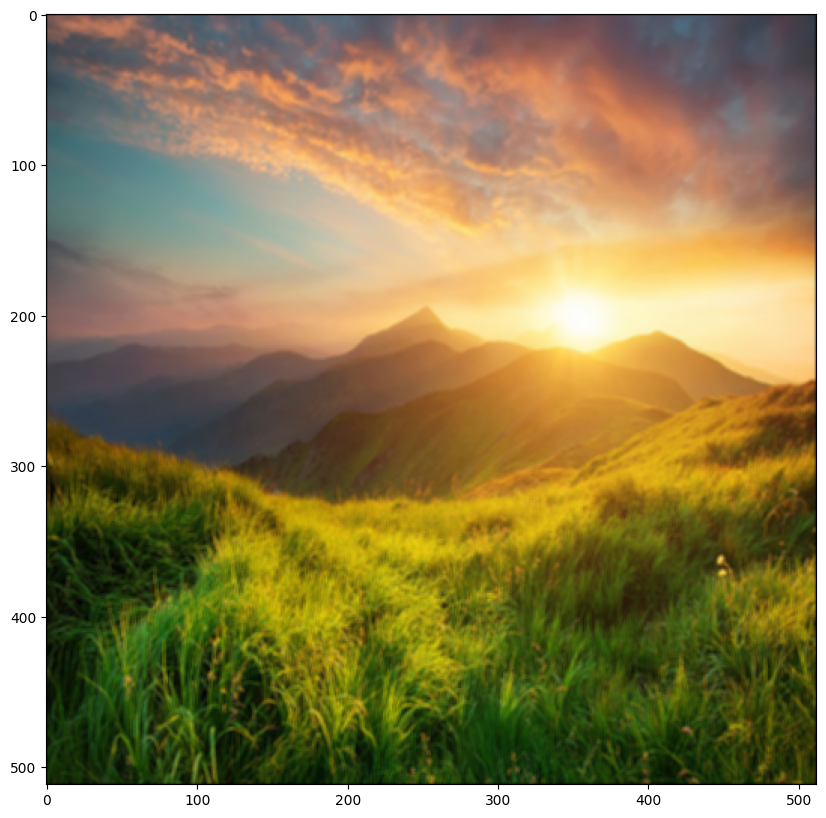

In [13]:
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

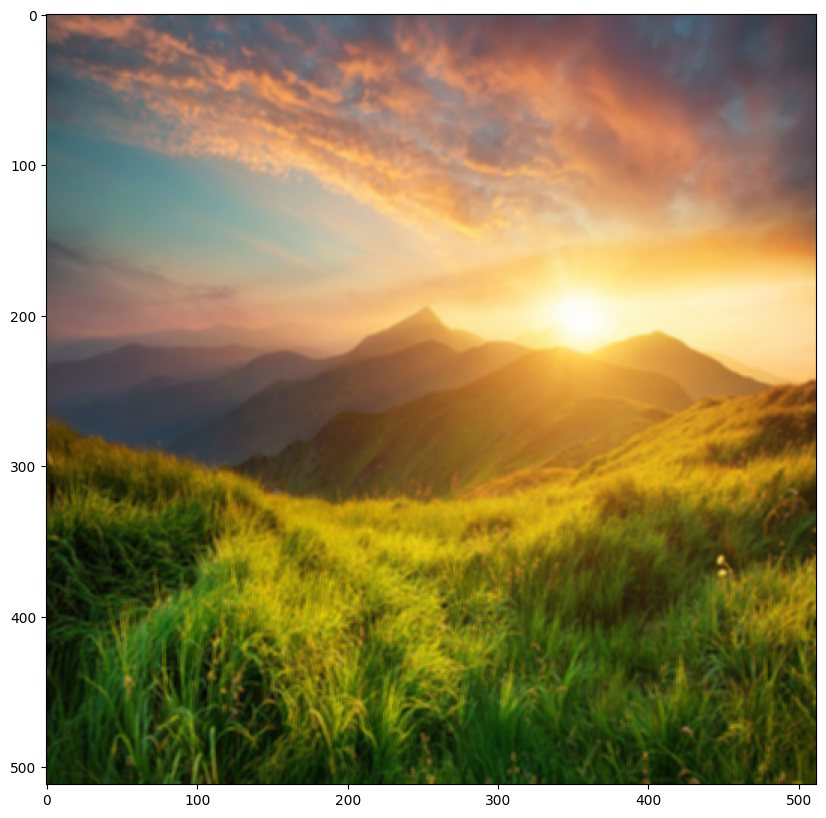

In [14]:
img_blur_ocv = cv2.GaussianBlur(img,(3,3),10)
display_img(img_blur_ocv)

###**Kernel Size = 3 and Sigma = 50**

In [15]:
kernel = gaussian_kernel(3, 50)

In [16]:
img_blur = conv(img, kernel)

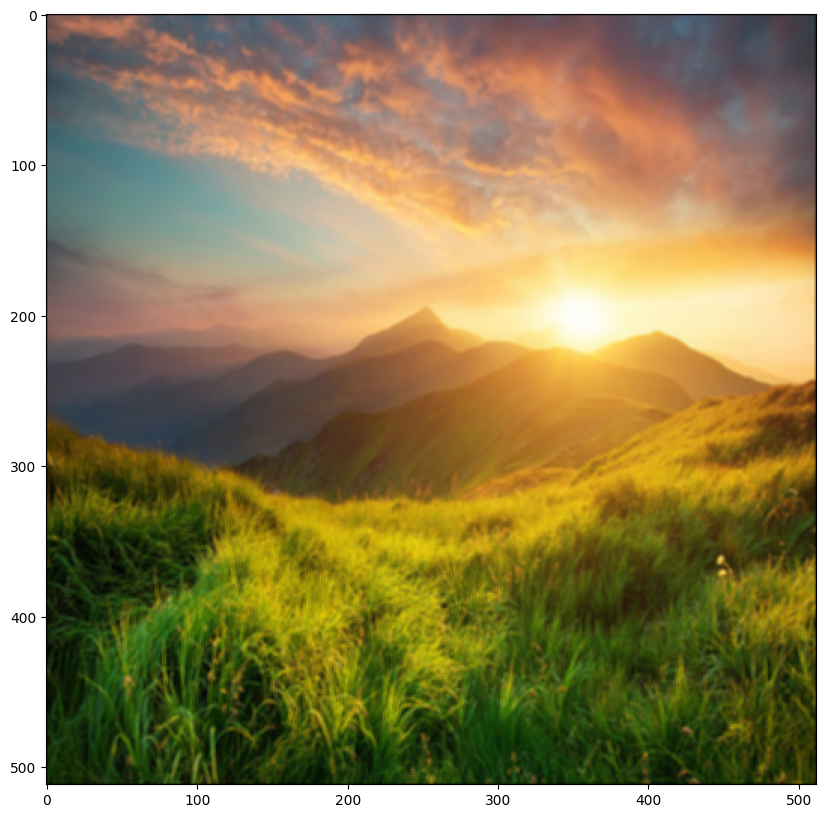

In [17]:
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

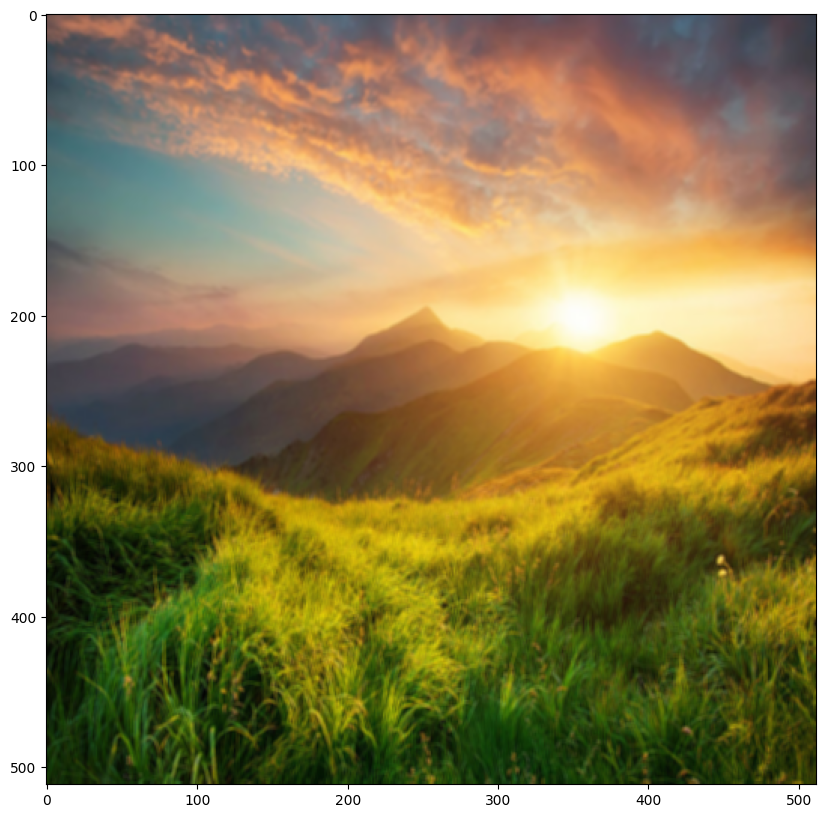

In [18]:
img_blur_ocv = cv2.GaussianBlur(img,(3,3),50)
display_img(img_blur_ocv)

###**Kernel Size = 5 and Sigma = 1**

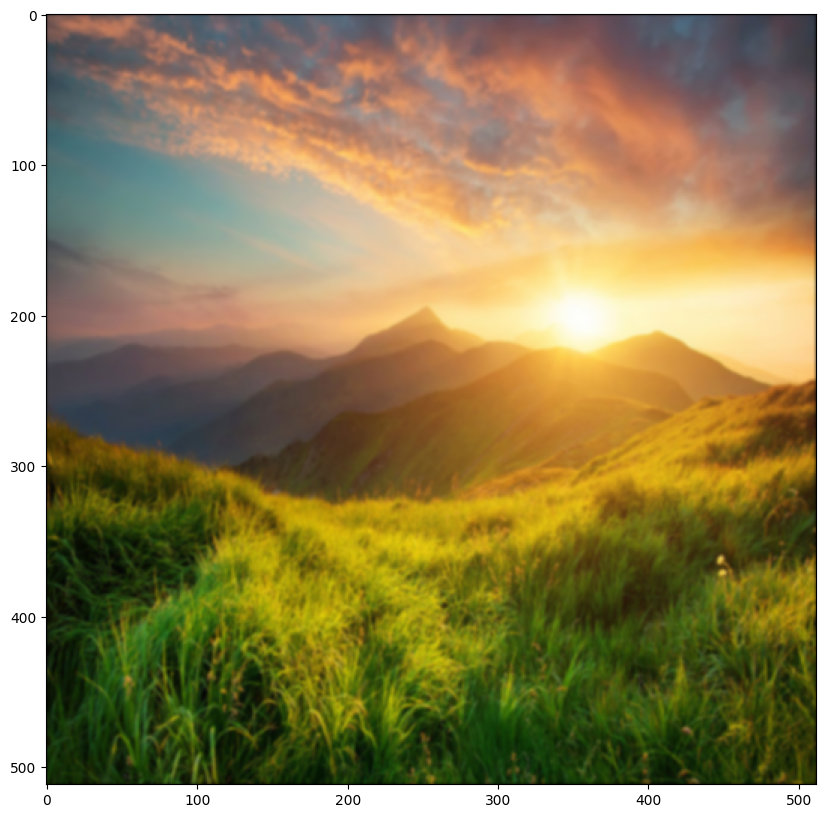

In [19]:
kernel = gaussian_kernel(5, 1)
img_blur = conv(img, kernel)
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

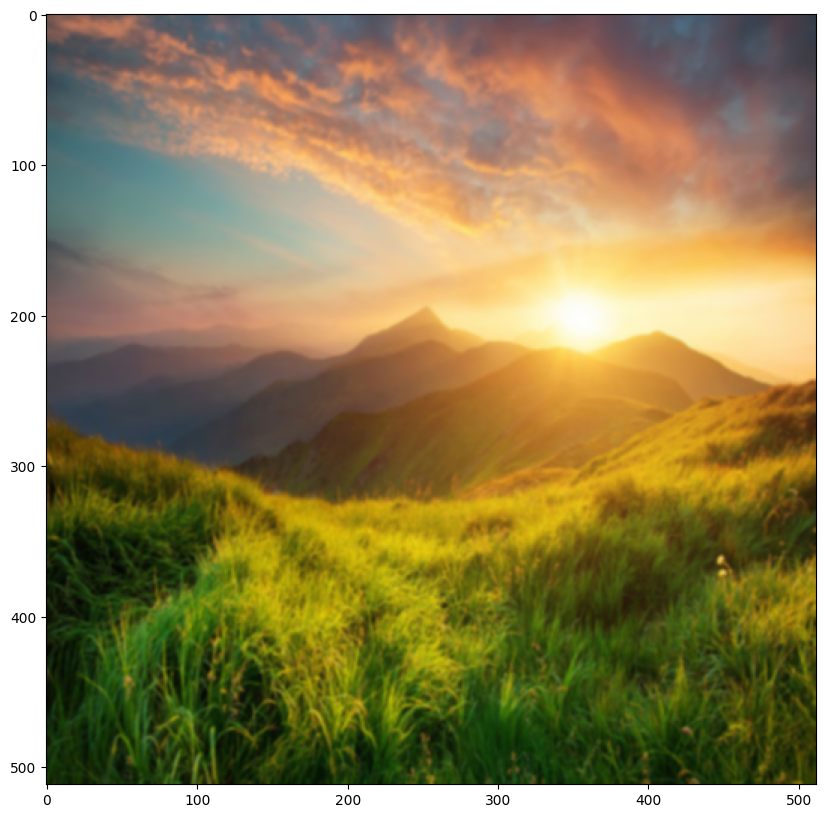

In [20]:
img_blur_ocv = cv2.GaussianBlur(img,(5,5),1)
display_img(img_blur_ocv)

###**Kernel Size = 5 and Sigma = 10**

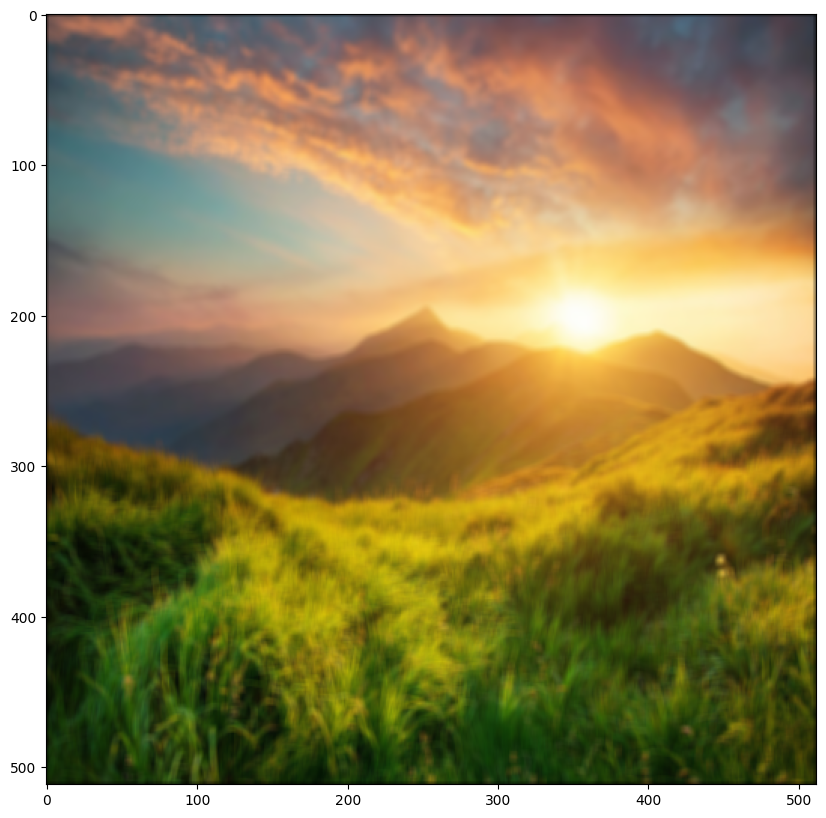

In [21]:
kernel = gaussian_kernel(5, 10)
img_blur = conv(img, kernel)
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

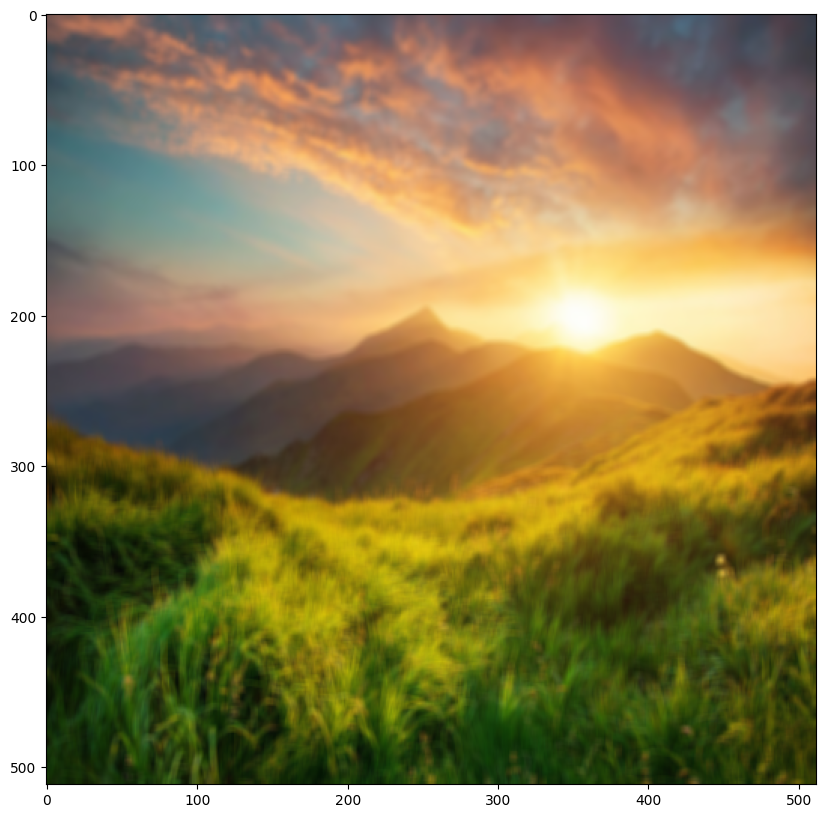

In [22]:
img_blur_ocv = cv2.GaussianBlur(img,(5,5),10)
display_img(img_blur_ocv)

###**Kernel Size = 5 and Sigma = 50**

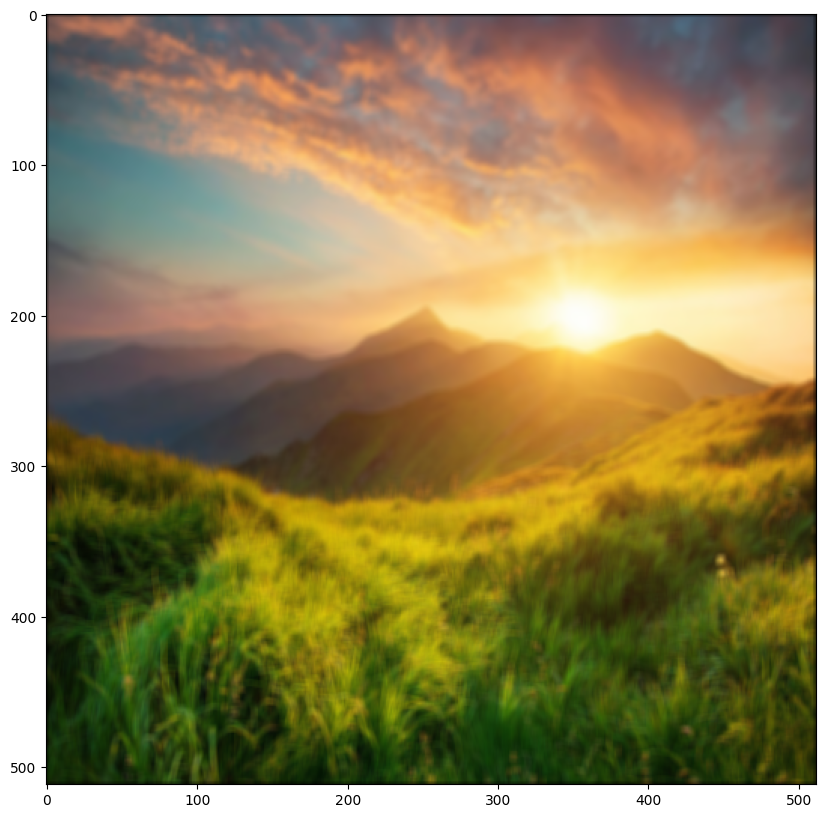

In [23]:
kernel = gaussian_kernel(5, 50)
img_blur = conv(img, kernel)
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

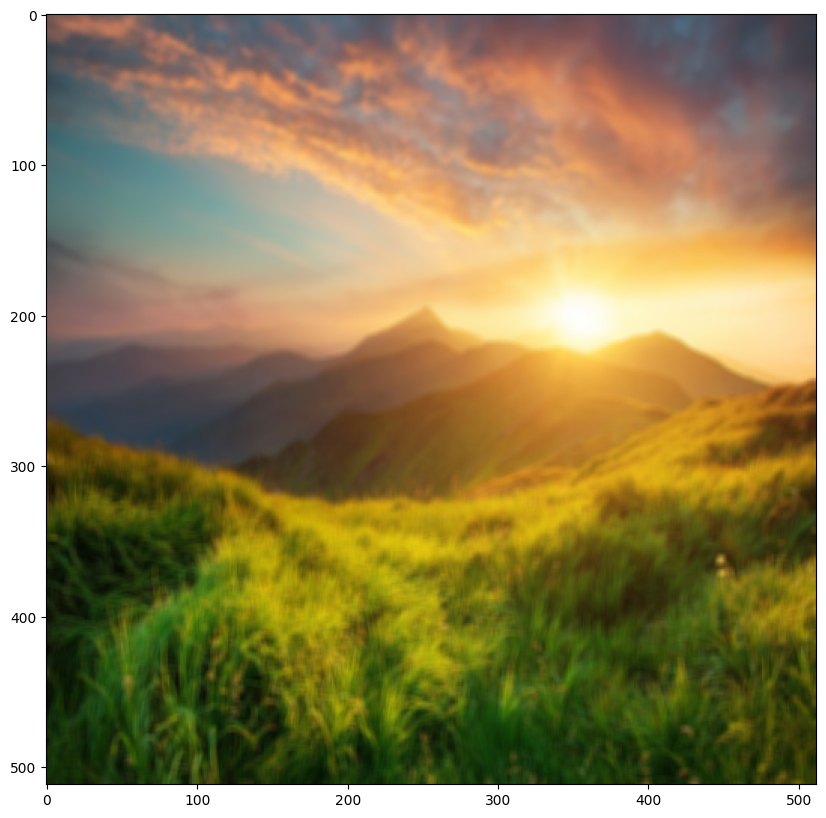

In [24]:
img_blur_ocv = cv2.GaussianBlur(img,(5,5),50)
display_img(img_blur_ocv)

###**Kernel Size = 7 and Sigma = 1**

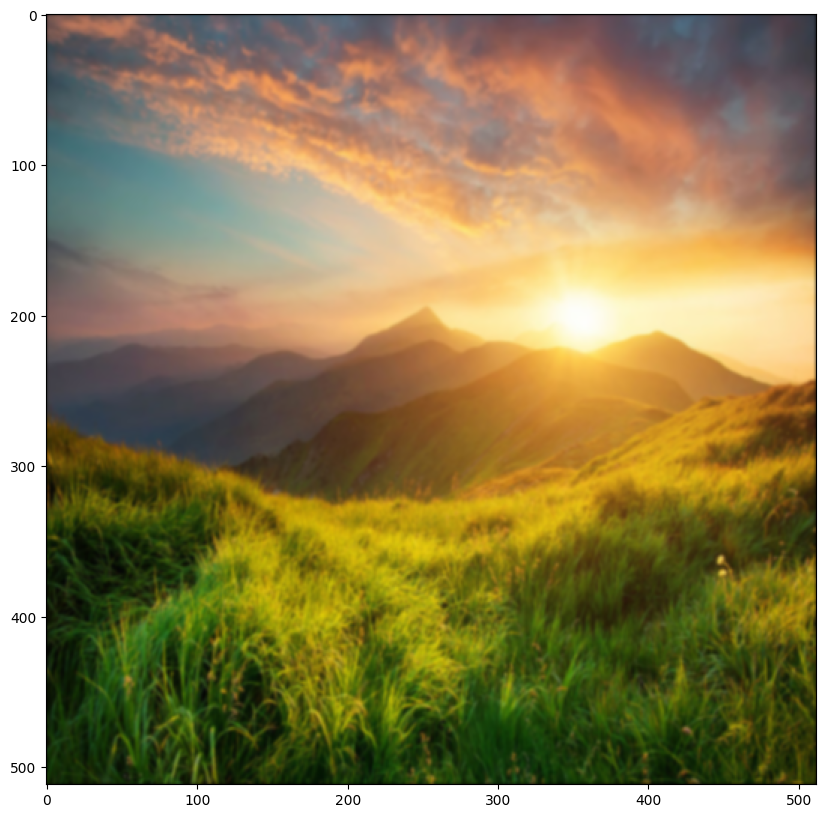

In [25]:
kernel = gaussian_kernel(7, 1)
img_blur = conv(img, kernel)
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

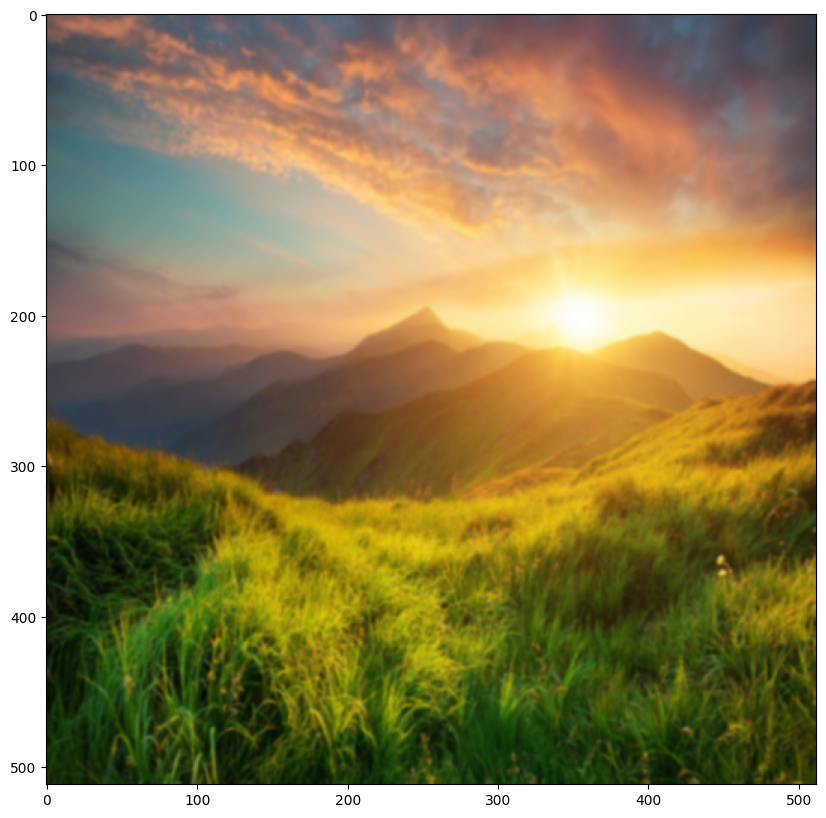

In [26]:
img_blur_ocv = cv2.GaussianBlur(img,(7,7),1)
display_img(img_blur_ocv)

###**Kernel Size = 7 and Sigma = 10**

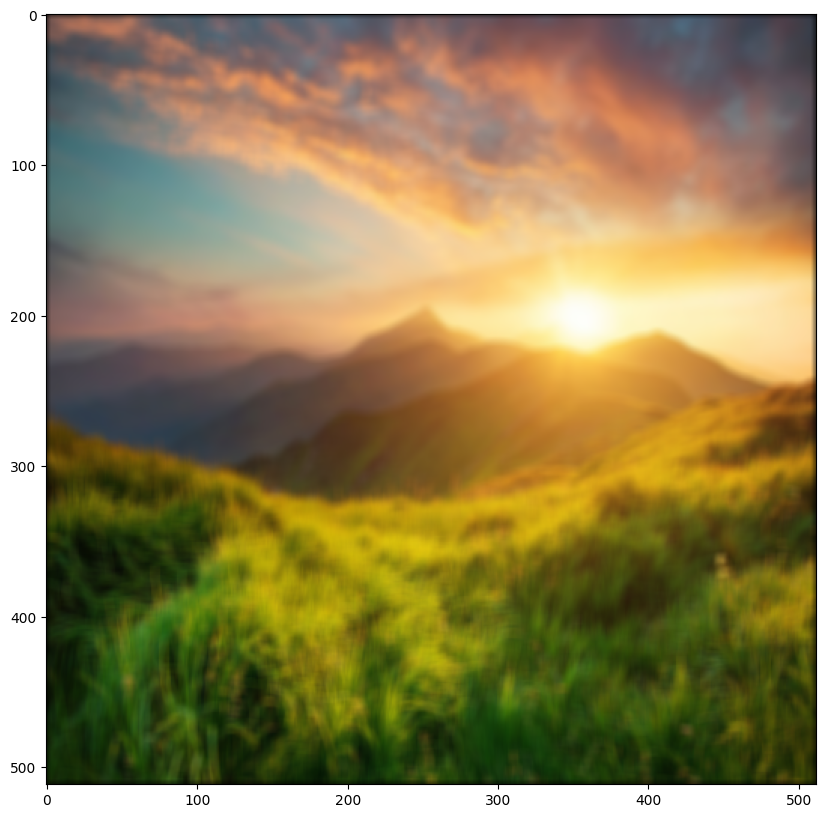

In [27]:
kernel = gaussian_kernel(7, 10)
img_blur = conv(img, kernel)
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

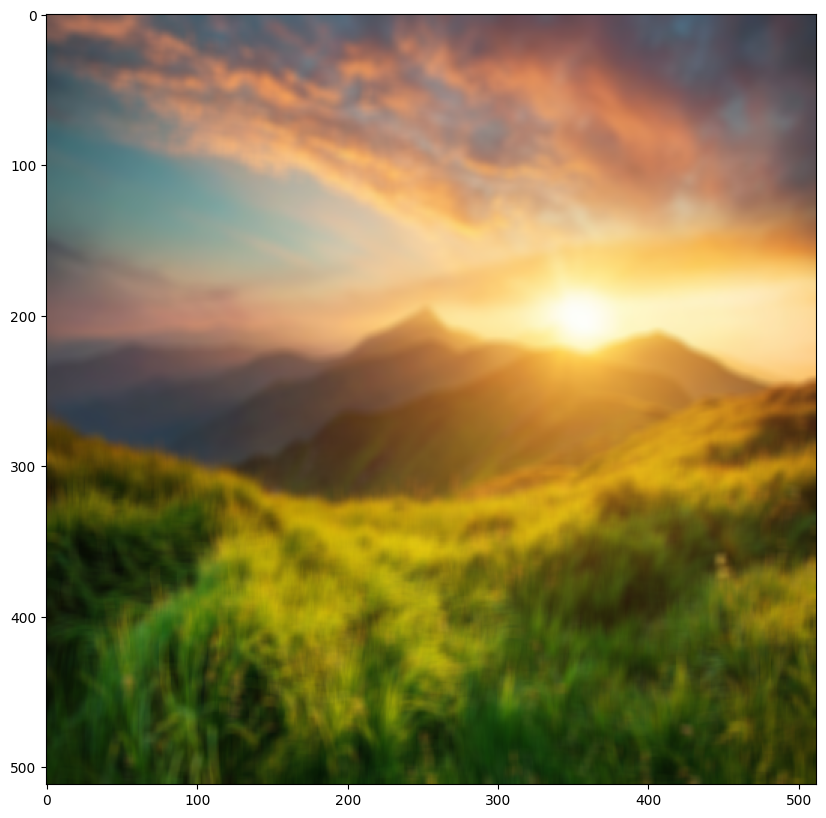

In [28]:
img_blur_ocv = cv2.GaussianBlur(img,(7,7),10)
display_img(img_blur_ocv)

###**Kernel Size = 7 and Sigma = 50**

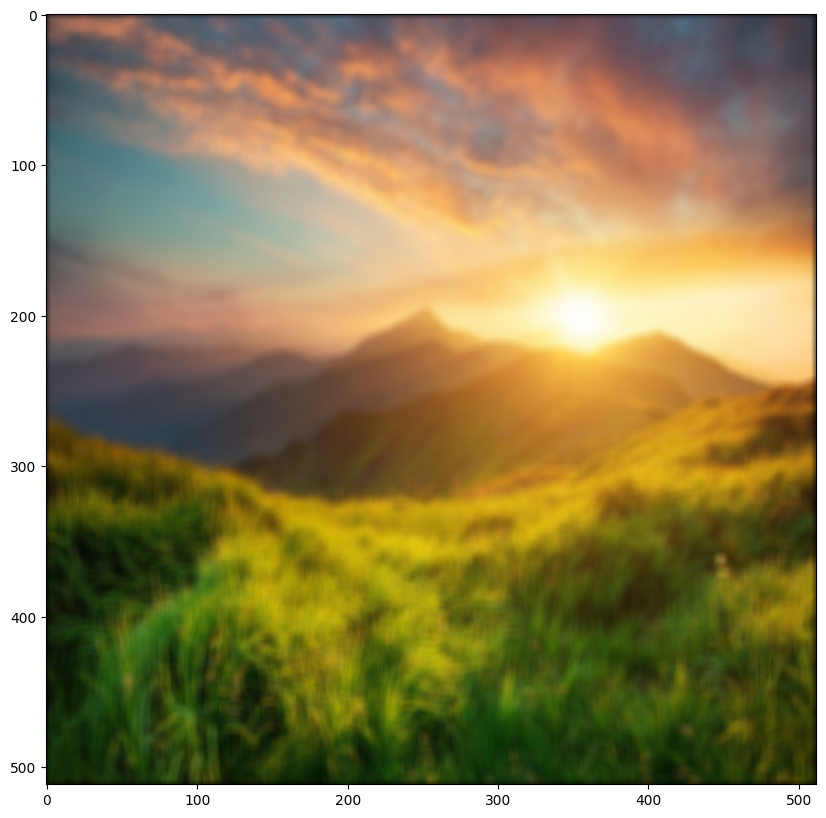

In [29]:
kernel = gaussian_kernel(7, 50)
img_blur = conv(img, kernel)
display_img(img_blur)

Now we will display the same image using the OpenCV library for comparison

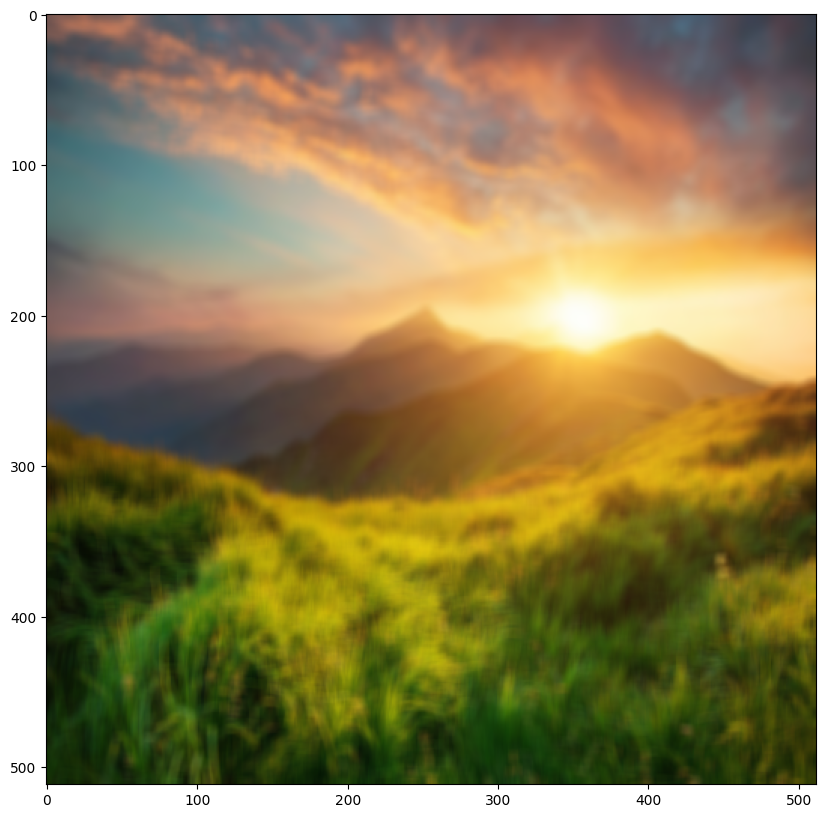

In [30]:
img_blur_ocv = cv2.GaussianBlur(img,(7,7),50)
display_img(img_blur_ocv)

#**2. Edge Detection using Sobel Filters**

There are two separate sobel filters for edge detection in the X direction and Y direction. Here are both the sobel filters

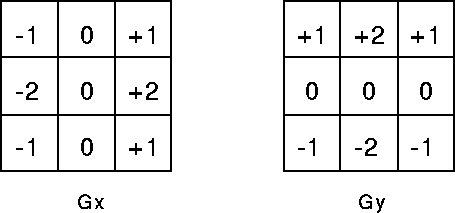

We will convolve the images with both the filters and blend output of those images to get the resultant image with the edges in X and Y direction

Before implementing this we have to convert the RGB image to the BGR image and convert that image to grayscale image

In [31]:
def display_img_gray(img):
    plt.figure(figsize=(12, 10))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()

In [32]:
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

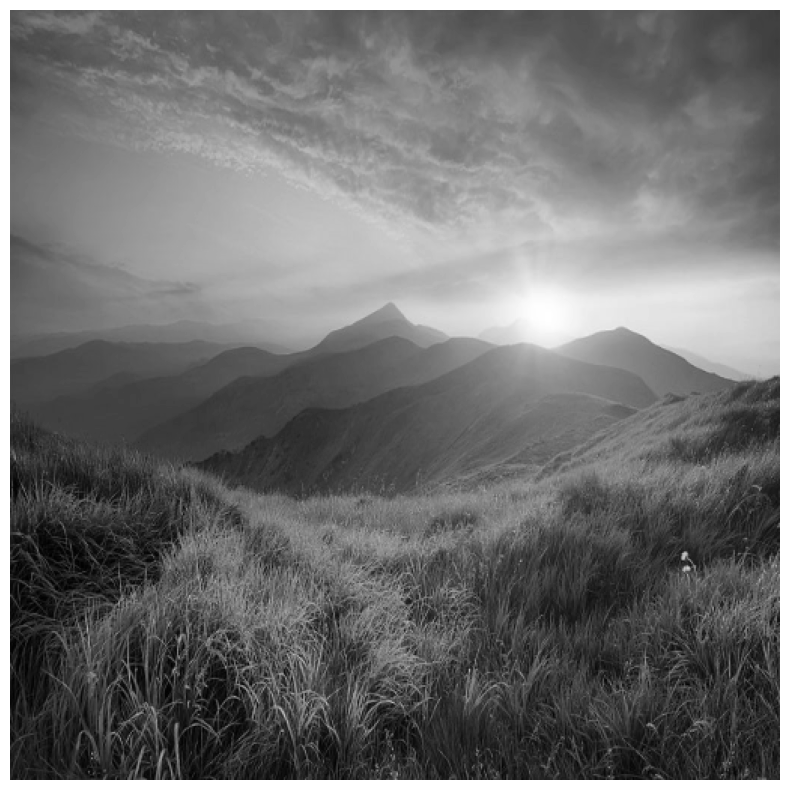

In [33]:
display_img_gray(gray_img)

In [51]:
sobelx = np.array([ [-1, -4, -6, -4, -1],
                    [-2, -8, -12, -8, -2],
                    [ 0,  0,  0,  0,  0],
                    [ 2,  8, 12,  8,  2],
                    [ 1,  4,  6,  4,  1]])

In [52]:
sobely = np.array([ [ 1,  2,  0, -2, -1],
                    [ 4,  8,  0, -8, -4],
                    [ 6, 12,  0,-12, -6],
                    [ 4,  8,  0, -8, -4],
                    [ 1,  2,  0, -2, -1]])

Now we will write the convolution function for 2 dim gray scale image

In [36]:
def conv_2(img, kernel):
  height, width = img.shape
  k_height, k_width = kernel.shape
  output_img = np.zeros((height, width))
  center_x, center_y = k_height // 2, k_width // 2

  for i in range(height):
    for j in range(width):
      conv_val = 0
      for ii in range(k_height):
        for jj in range(k_width):
          x = i + ii - center_x
          y = j + jj - center_y

          if x >= 0 and x < height and y >= 0 and y < width:
            conv_val += img[x, y] * kernel[ii, jj]

      output_img[i, j] = conv_val

  return output_img

In [53]:
convx = conv_2(gray_img, sobelx)

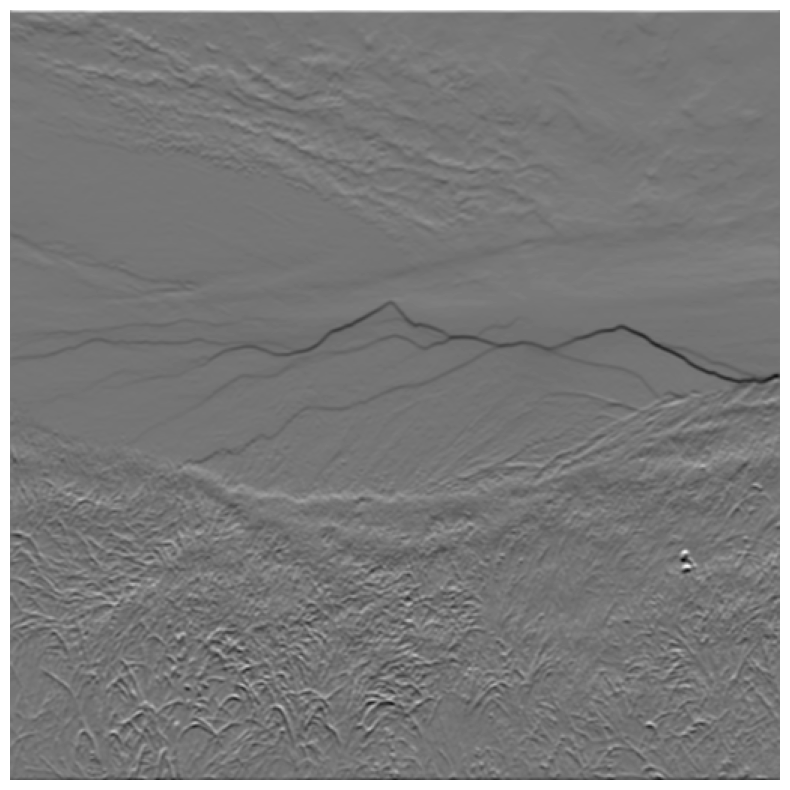

In [54]:
display_img_gray(convx)

Now we will display the same image using the OpenCV library for comparison

In [61]:
convx_ocv = cv2.Sobel(gray_img,cv2.CV_64F,1,0,ksize=5)

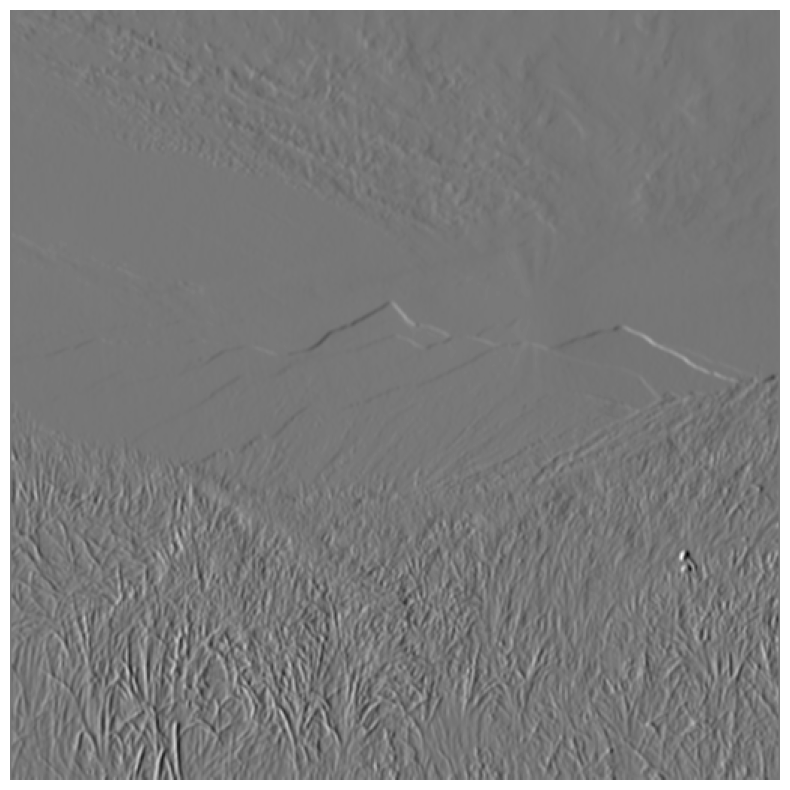

In [62]:
display_img_gray(convx_ocv)

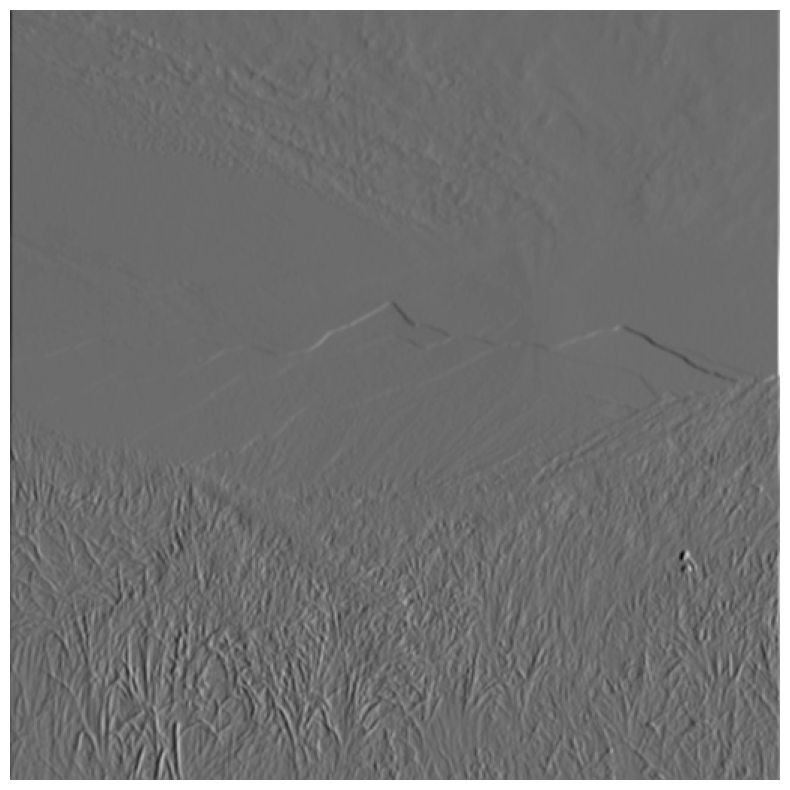

In [63]:
convy = conv_2(gray_img, sobely)
display_img_gray(convy)

Now we will display the same image using the OpenCV library for comparison

In [49]:
convy_ocv = cv2.Sobel(gray_img,cv2.CV_64F,0,1,ksize=5)

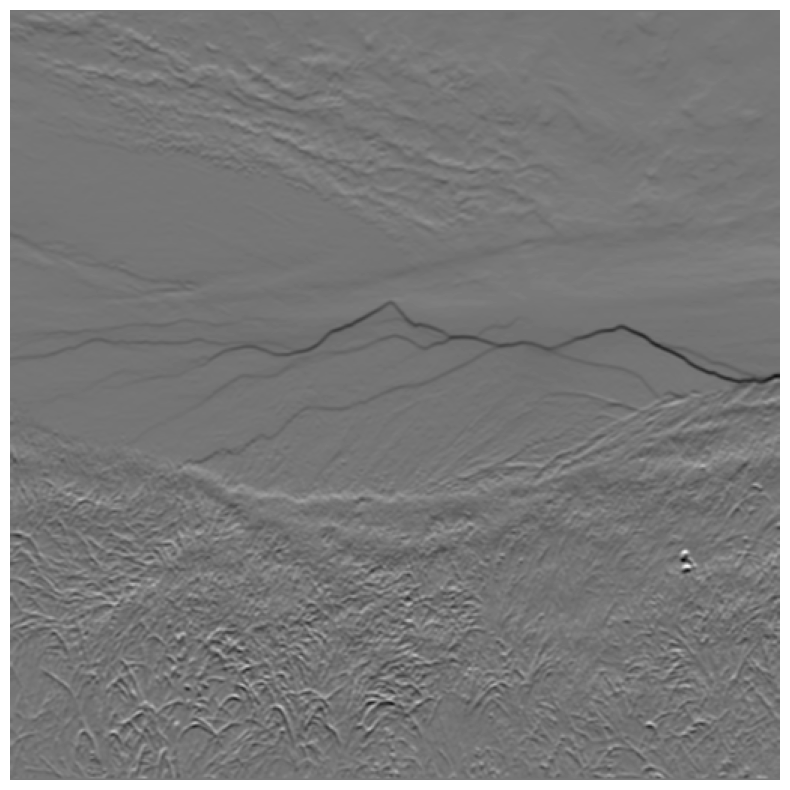

In [50]:
display_img_gray(convy_ocv)

In [83]:
combined_img = cv2.addWeighted(src1=convx,alpha=0.5,src2=convy,beta=0.5,gamma=0)

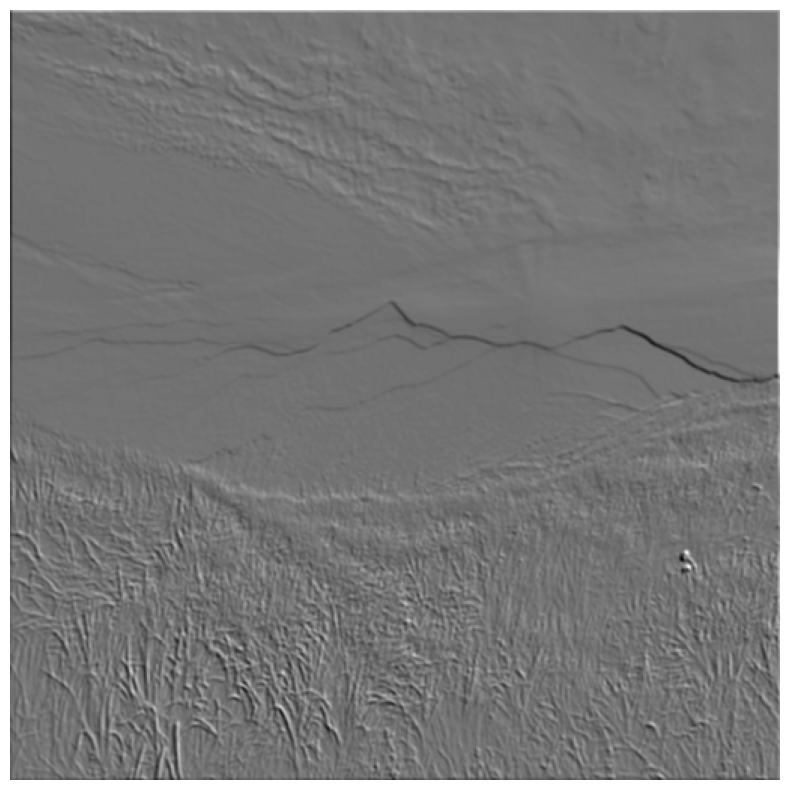

In [84]:
display_img_gray(combined_img)

Now we will display the same image using the OpenCV library for comparison

In [85]:
combined_img_ocv = cv2.addWeighted(src1=convx_ocv,alpha=0.5,src2=convy_ocv,beta=0.5,gamma=0)

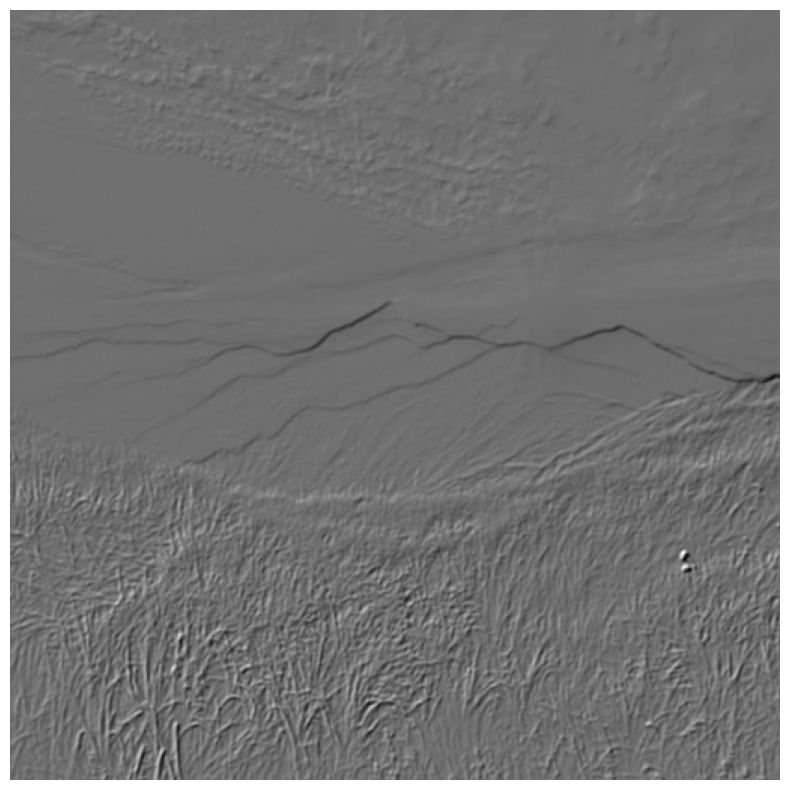

In [86]:
display_img_gray(combined_img_ocv)

#**3. Edge Detection Using Laplacian Function**

Now we will implement laplce function to find edges. For that we will convolve the gray scale image with the Laplacian kernel. The laplacian kernel is given below

In [68]:
laplacian_kernel = np.array([[0, 1, 0],
                             [1, -4, 1],
                             [0, 1, 0]])

In [69]:
conv_laplace = conv_2(gray_img, laplacian_kernel)

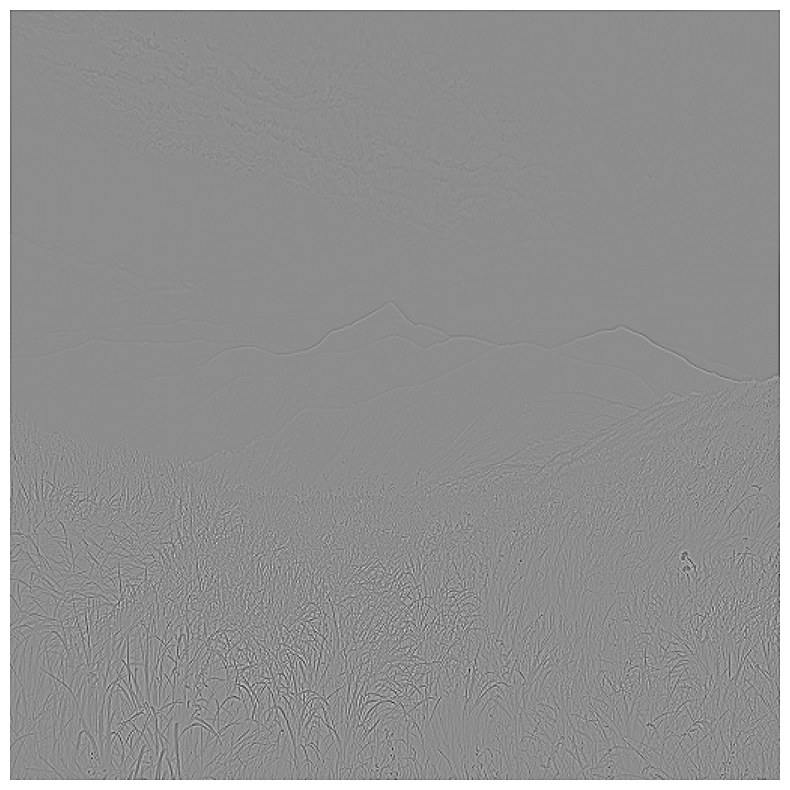

In [70]:
display_img_gray(conv_laplace)

Now we will display the same image using the OpenCV library for comparison. But the OpenCV Laplacian function expects the uint6 datatype

In [80]:
scaled_img_gray = (gray_img * 255).astype(np.uint8)

In [81]:
conv_laplace_ocv = cv2.Laplacian(scaled_img_gray,cv2.CV_64F)

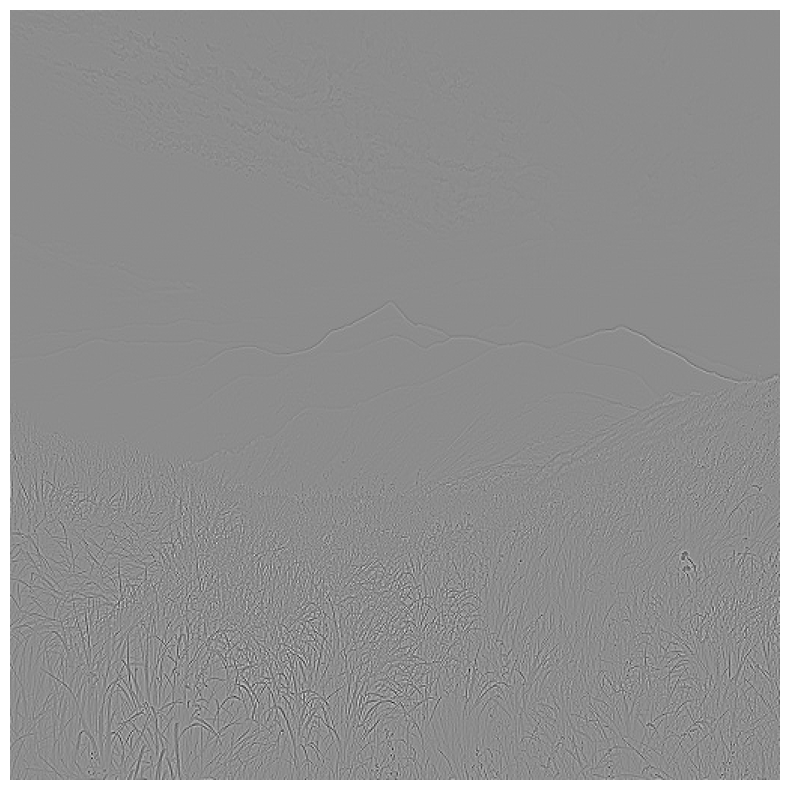

In [82]:
display_img_gray(conv_laplace_ocv)